In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt


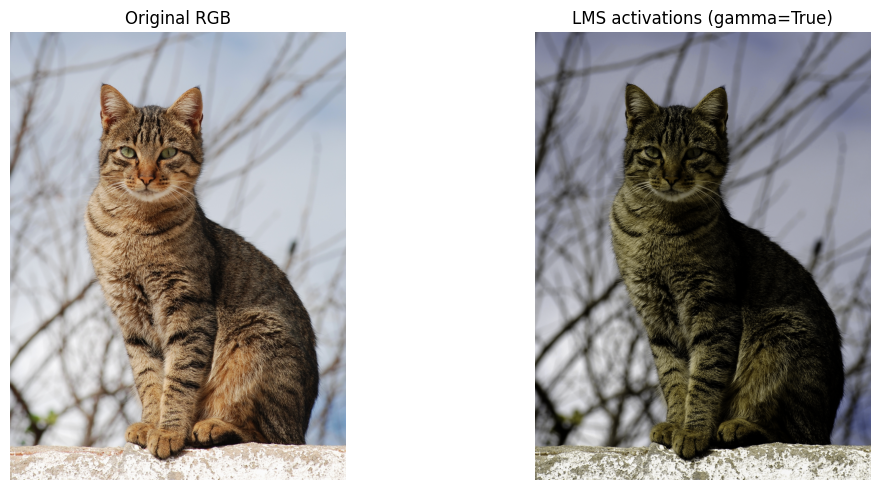

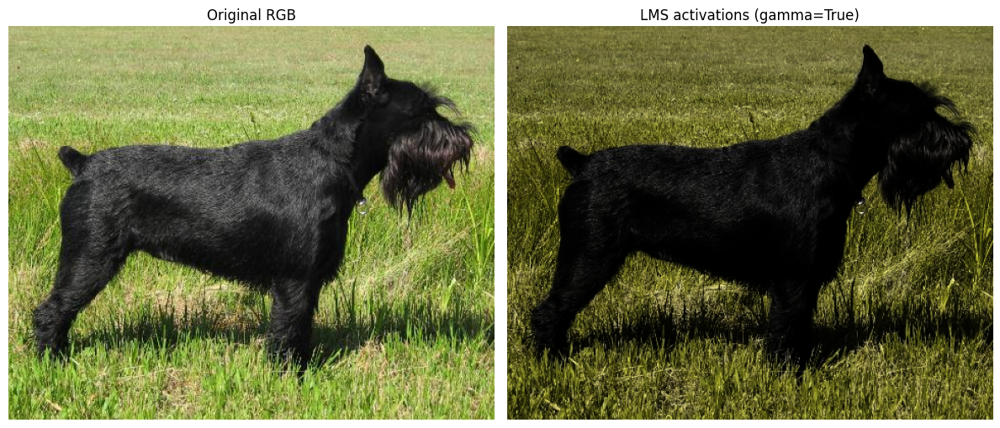

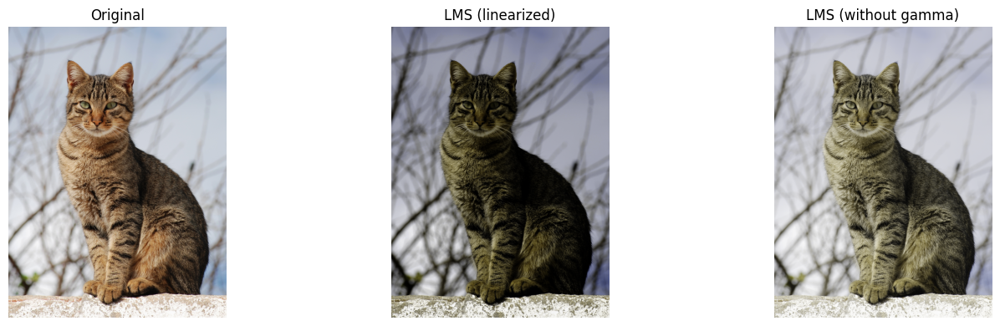

In [2]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt


def rgb_to_lms(image_path: str, linearize_gamma: bool = True, gamma: float = 2.2) -> np.ndarray:

    img = Image.open(image_path).convert('RGB')
    rgb = np.array(img, dtype=np.float32) / 255.0
    
    if linearize_gamma:
        rgb = np.power(rgb, gamma)
    
    rgb_to_lms_matrix = np.array([
        [0.31399, 0.63951, 0.04649],  # L
        [0.15537, 0.75789, 0.08670],  # M
        [0.01775, 0.10944, 0.87262],  # S
    ], dtype=np.float32)
    
    lms = rgb @ rgb_to_lms_matrix.T
    
    lms = np.clip(lms, 0.0, 1.0)
    
    return lms


def visualize_comparison(image_path: str, linearize_gamma: bool = True):
    original = np.array(Image.open(image_path).convert('RGB'))
    lms = rgb_to_lms(image_path, linearize_gamma=linearize_gamma)
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    axes[0].imshow(original)
    axes[0].set_title('Original RGB')
    axes[0].axis('off')
    
    axes[1].imshow(lms)
    axes[1].set_title(f'LMS activations (gamma={linearize_gamma})')
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()




visualize_comparison('cat.jpg', linearize_gamma=True)

visualize_comparison('dog.jpg', linearize_gamma=True)


fig, axes = plt.subplots(1, 3, figsize=(15, 4))

original = np.array(Image.open('cat.jpg').convert('RGB'))
lms_linear = rgb_to_lms('cat.jpg', linearize_gamma=True)
lms_raw = rgb_to_lms('cat.jpg', linearize_gamma=False)

axes[0].imshow(original)
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(lms_linear)
axes[1].set_title('LMS (linearized)')
axes[1].axis('off')

axes[2].imshow(lms_raw)
axes[2].set_title('LMS (without gamma)')
axes[2].axis('off')

plt.tight_layout()
plt.show()

In [3]:
def plot_point_sets(data, title: str = "3D view", point_size: float = 2.0, alpha: float = 0.6):

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    if isinstance(data, np.ndarray):
        data_to_plot = {"Data": data}
    elif isinstance(data, dict):
        data_to_plot = data
    else:
        raise ValueError("data must be np.ndarray or dict.")
        
    all_coords = []
    for label, points in data_to_plot.items():
        if isinstance(points, np.ndarray) and points.ndim == 2 and points.shape[1] == 3:
            
            if len(points) > 0:
                ax.scatter(points[:, 0], points[:, 1], points[:, 2], 
                           s=point_size, label=label, alpha=alpha)
                
                all_coords.append(points)
        else:
            pass 

    if all_coords:
        combined = np.vstack(all_coords)
        max_range = np.array([combined[:,0].max()-combined[:,0].min(), 
                              combined[:,1].max()-combined[:,1].min(), 
                              combined[:,2].max()-combined[:,2].min()]).max() / 2.0

        mid_x = (combined[:,0].max()+combined[:,0].min()) * 0.5
        mid_y = (combined[:,1].max()+combined[:,1].min()) * 0.5
        mid_z = (combined[:,2].max()+combined[:,2].min()) * 0.5

        ax.set_xlim(mid_x - max_range, mid_x + max_range)
        ax.set_ylim(mid_y - max_range, mid_y + max_range)
        ax.set_zlim(mid_z - max_range, mid_z + max_range)

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(title)
    ax.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

In [4]:
def uniform_cap_points(n: int, r: float = 1.0, angle_deg: float = 10.0, noise: float = 0.0) -> np.ndarray:
    if n <= 0:
        return np.array([]).reshape(0, 3)
    
    angle_rad = np.radians(angle_deg)
    y_min, y_max = np.cos(angle_rad), 1.0
    golden_angle = np.pi * (3.0 - np.sqrt(5.0))
    
    points = []
    for i in range(n):
        t = i / (n - 1) if n > 1 else 0.5
        y = y_max - t * (y_max - y_min)
        theta = golden_angle * i
        
        if noise > 0:
            y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
            theta += np.random.uniform(-1, 1) * noise * np.pi
        
        radius_xz = np.sqrt(max(0, 1.0 - y**2))
        points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
    
    return np.array(points)


In [5]:
cap = uniform_cap_points(n=20000,r=0.7,angle_deg=140,noise=0.3)

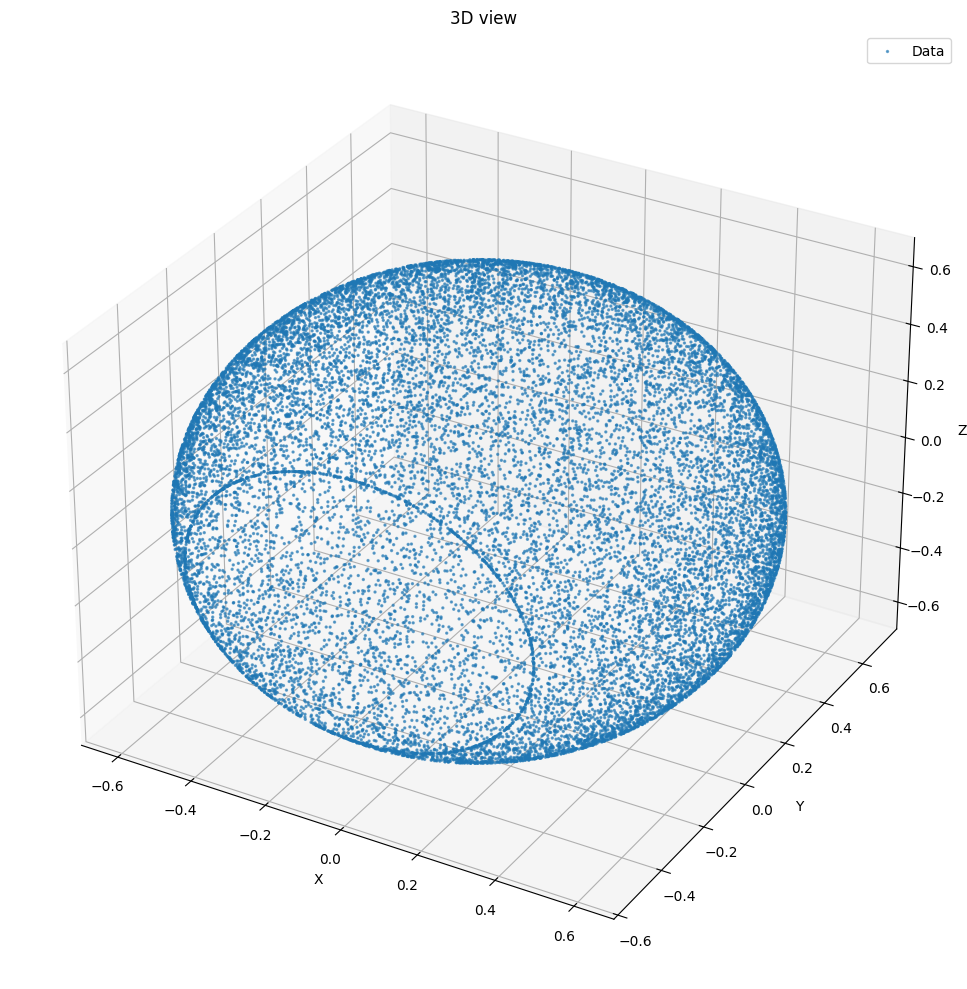

In [6]:
plot_point_sets(cap)

In [7]:
def uniform_sphere_band(n: int, r: float = 1.0, angle_start_deg: float = 1.2, 
                        angle_end_deg: float = 30.0, noise: float = 0.0) -> np.ndarray:
    if n <= 0:
        return np.array([]).reshape(0, 3)
    
    y_max = np.cos(np.radians(angle_start_deg))
    y_min = np.cos(np.radians(angle_end_deg))
    
    if y_min >= y_max:
        raise ValueError(f"Pronlem with angles: start={angle_start_deg}° end={angle_end_deg}°")
    
    golden_angle = np.pi * (3.0 - np.sqrt(5.0))
    
    points = []
    for i in range(n):
        t = i / (n - 1) if n > 1 else 0.5
        y = y_max - t * (y_max - y_min)
        theta = golden_angle * i
        
        if noise > 0:
            y = np.clip(y + np.random.uniform(-1, 1) * noise, y_min, y_max)
            theta += np.random.uniform(-1, 1) * noise * np.pi
        
        radius_xz = np.sqrt(max(0, 1.0 - y**2))
        points.append([np.cos(theta) * radius_xz * r, y * r, np.sin(theta) * radius_xz * r])
    
    return np.array(points)

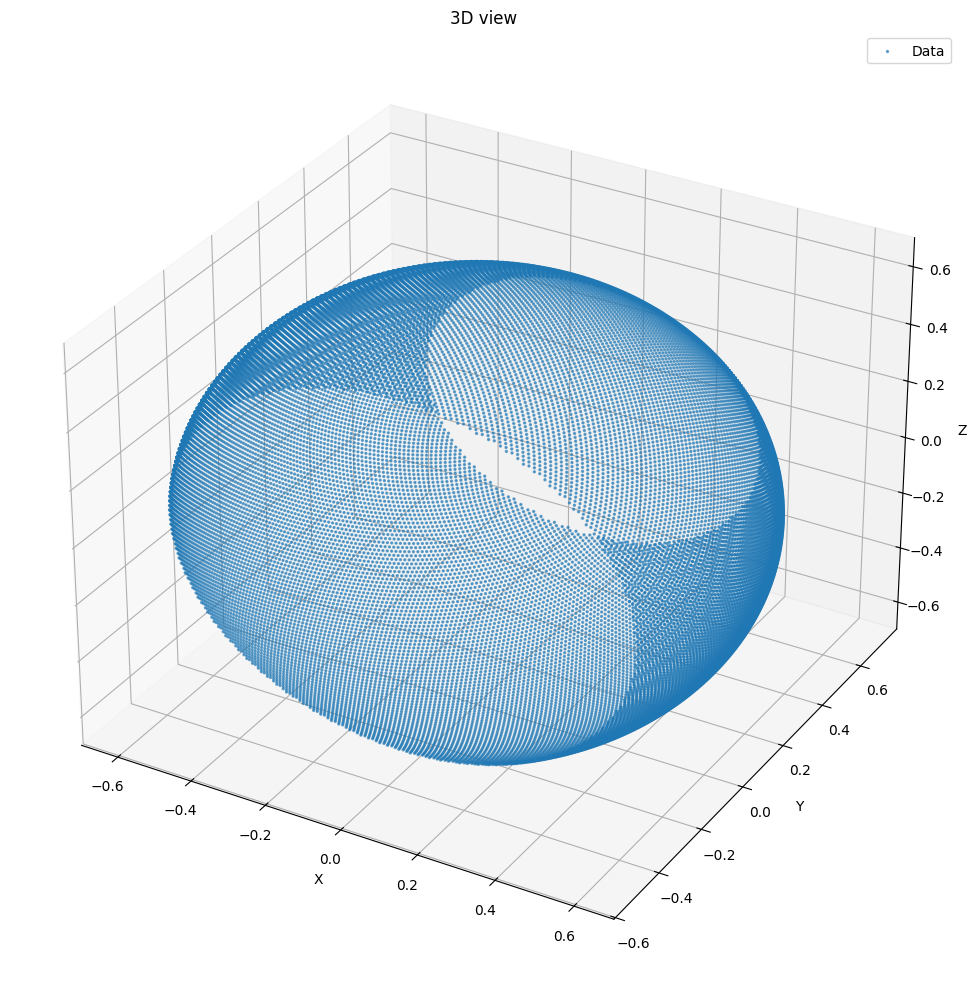

In [8]:
sphere_band = uniform_sphere_band(n=30000,r=0.7,angle_start_deg=40,angle_end_deg=120)
plot_point_sets(sphere_band)

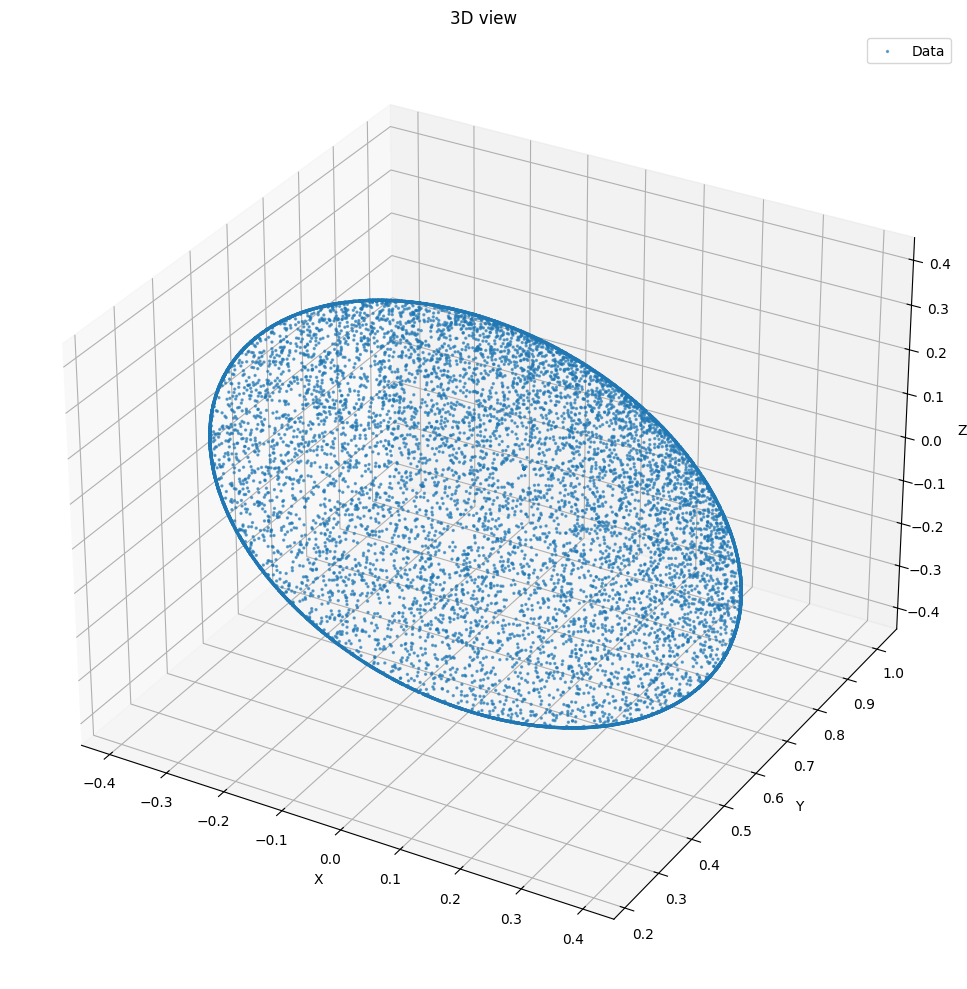

In [9]:
cap = uniform_cap_points(n=20000,r=0.7,angle_deg=40,noise=0.3)
plot_point_sets(cap)

In [10]:
def inner_layer(n_band=4400,n_foveola=5000,r=0.7,angle_start_deg=40,angle_end_deg=120,noise=0.3,concat=True):
    sphere_band = uniform_sphere_band(n=n_band,r=r,angle_start_deg=angle_start_deg,angle_end_deg=angle_end_deg,noise=noise)
    cap = uniform_cap_points(n=n_foveola,r=r,angle_deg=angle_start_deg,noise=noise)
    if concat:
        return np.concatenate((sphere_band, cap), axis=0)
    else:
        return (sphere_band, cap)
    

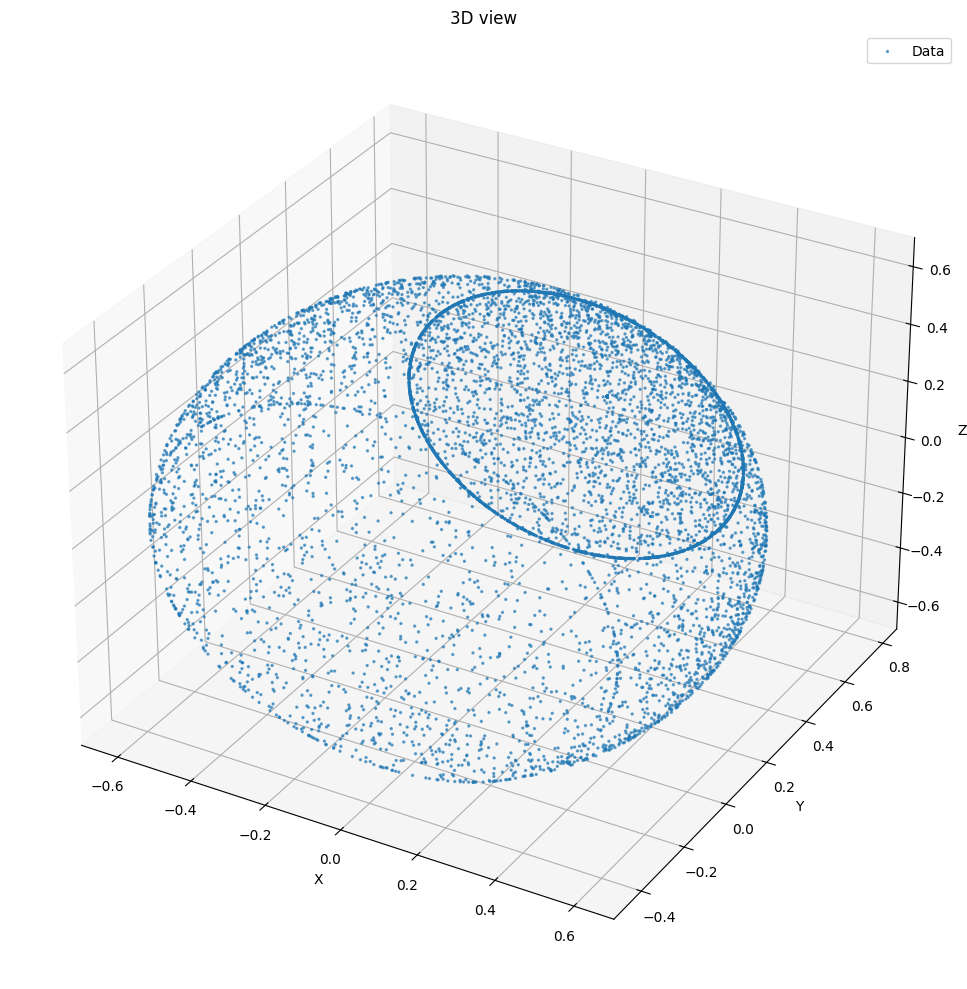

In [11]:
plot_point_sets(inner_layer())

In [12]:

DEFAULT_PARAMS = {
    'layer_count': 20000,
    
    'rod_ratio': 0.952,
    'L_ratio': 0.030,
    'M_ratio': 0.015,
    'S_ratio': 0.003,
    
    'foveola_L_ratio_base': 0.004,
    'foveola_M_ratio_base': 0.004,
    'foveola_angle_base_deg': 0.6,
    'foveola_max_ratio': 0.5,
    
    'foveola_angle_deg': 0.6,
    'iris_angle_deg': 110.0,
    
    'radius': 1.0,
    'noise': 0.02,
}


def _spherical_cap_area(angle_deg: float) -> float:
    return 1.0 - np.cos(np.radians(angle_deg))


def _compute_foveola_ratios(p: dict) -> tuple:
    base_area = _spherical_cap_area(p['foveola_angle_base_deg'])
    current_area = _spherical_cap_area(p['foveola_angle_deg'])
    
    scale = current_area / base_area if base_area > 0 else 1.0
    
    L_ratio = min(p['foveola_max_ratio'], p['foveola_L_ratio_base'] * scale)
    M_ratio = min(p['foveola_max_ratio'], p['foveola_M_ratio_base'] * scale)
    
    return L_ratio, M_ratio


def _compute_populations(p: dict) -> dict:
    layer_count = p['layer_count']
    fov_L_ratio, fov_M_ratio = _compute_foveola_ratios(p)
    
    total_L = layer_count * p['L_ratio']
    total_M = layer_count * p['M_ratio']
    total_S = layer_count * p['S_ratio']
    total_rods = layer_count * p['rod_ratio']
    
    return {
        'L_foveola': max(1, math.ceil(total_L * fov_L_ratio)),
        'M_foveola': max(1, math.ceil(total_M * fov_M_ratio)),
        'L_peripheral': max(1, math.ceil(total_L * (1 - fov_L_ratio))),
        'M_peripheral': max(1, math.ceil(total_M * (1 - fov_M_ratio))),
        'S_peripheral': max(1, math.ceil(total_S)),
        'rods': math.ceil(total_rods),
        '_fov_L_ratio': fov_L_ratio,
        '_fov_M_ratio': fov_M_ratio,
    }


def _generate_points(pop: dict, p: dict) -> dict:
    r, noise = p['radius'], p['noise']
    fov_angle = p['foveola_angle_deg']
    iris_angle = p['iris_angle_deg']
    
    return {
        'L_foveola': uniform_cap_points(pop['L_foveola'], r, fov_angle, noise * 0.5),
        'M_foveola': uniform_cap_points(pop['M_foveola'], r, fov_angle, noise * 0.5),
        'L_peripheral': uniform_sphere_band(pop['L_peripheral'], r, fov_angle, iris_angle, noise),
        'M_peripheral': uniform_sphere_band(pop['M_peripheral'], r, fov_angle, iris_angle, noise),
        'S_peripheral': uniform_sphere_band(pop['S_peripheral'], r, fov_angle, iris_angle, noise),
        'rods': uniform_sphere_band(pop['rods'], r, fov_angle, iris_angle, noise),
    }


def _plot_layer(points: dict, p: dict, pop: dict):
    fig = plt.figure(figsize=(14, 6))
    r = p['radius']
    
    def scatter_all(ax):
        ax.scatter(*points['rods'].T, s=1, c='gray', alpha=0.2, label=f"Rods ({len(points['rods'])})")
        ax.scatter(*points['L_peripheral'].T, s=3, c='red', alpha=0.5, label=f"L ({len(points['L_peripheral'])})")
        ax.scatter(*points['L_foveola'].T, s=8, c='darkred', alpha=0.9, label=f"L fov ({len(points['L_foveola'])})")
        ax.scatter(*points['M_peripheral'].T, s=3, c='green', alpha=0.5, label=f"M ({len(points['M_peripheral'])})")
        ax.scatter(*points['M_foveola'].T, s=8, c='darkgreen', alpha=0.9, label=f"M fov ({len(points['M_foveola'])})")
        ax.scatter(*points['S_peripheral'].T, s=5, c='blue', alpha=0.7, label=f"S ({len(points['S_peripheral'])})")
        ax.set_xlim(-r*1.2, r*1.2)
        ax.set_ylim(-r*1.2, r*1.2)
        ax.set_zlim(-r*1.2, r*1.2)
    
    fov_pct = pop['_fov_L_ratio'] * 100
    title = f'Foveola={p["foveola_angle_deg"]}° ({fov_pct:.1f}% L/M), Iris={p["iris_angle_deg"]}°'
    
    ax1 = fig.add_subplot(121, projection='3d')
    scatter_all(ax1)
    ax1.legend(loc='upper left', fontsize=8)
    ax1.set_title(title)
    ax1.view_init(elev=15, azim=45)
    
    ax2 = fig.add_subplot(122, projection='3d')
    scatter_all(ax2)
    ax2.set_title('Frontview')
    ax2.view_init(elev=90, azim=0)
    
    plt.tight_layout()
    plt.show()


def create_photoreceptor_layer(params: dict = None, plot: bool = False) -> dict:
    p = {**DEFAULT_PARAMS, **(params or {})}
    
    pop = _compute_populations(p)
    points = _generate_points(pop, p)
    
    total_cones = sum(len(points[k]) for k in ['L_foveola', 'M_foveola', 'L_peripheral', 'M_peripheral', 'S_peripheral'])
    
    result = {
        **points,
        'counts': {
            **{k: len(v) for k, v in points.items()},
            'total_cones': total_cones,
            'total': total_cones + len(points['rods']),
            'foveola_L_ratio': pop['_fov_L_ratio'],
            'foveola_M_ratio': pop['_fov_M_ratio'],
        },
        'params': p,
    }
    
    if plot:
        _plot_layer(points, p, pop)
    
    return result

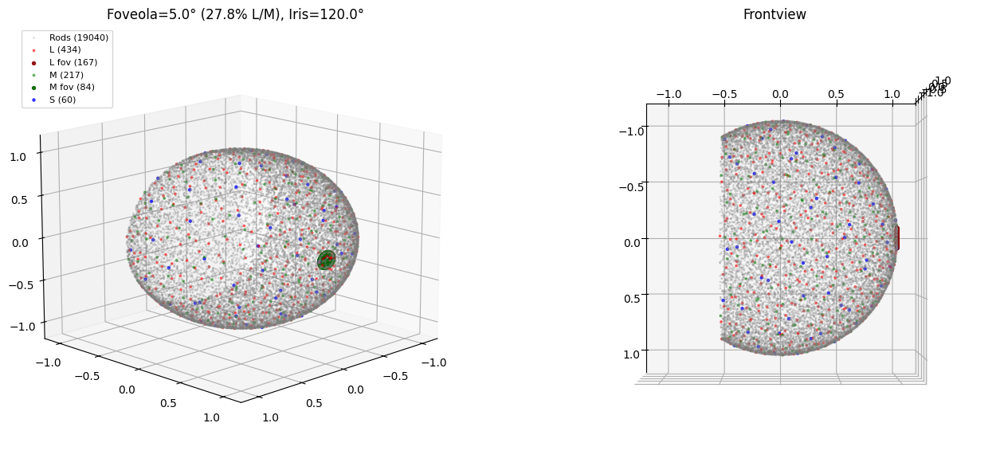

In [13]:
default={
    'layer_count': 20000,
    
    'rod_ratio': 0.952,
    'L_ratio': 0.030,
    'M_ratio': 0.015,
    'S_ratio': 0.003,
    
    'foveola_L_ratio_base': 0.004,
    'foveola_M_ratio_base': 0.004,
    'foveola_angle_base_deg': 0.6,
    'foveola_max_ratio': 0.5,
    
    'foveola_angle_deg': 5.0,
    'iris_angle_deg': 120.0,
    
    'radius': 1.0,
    'noise': 0.02,
}
photo1 = create_photoreceptor_layer(default,plot=True)


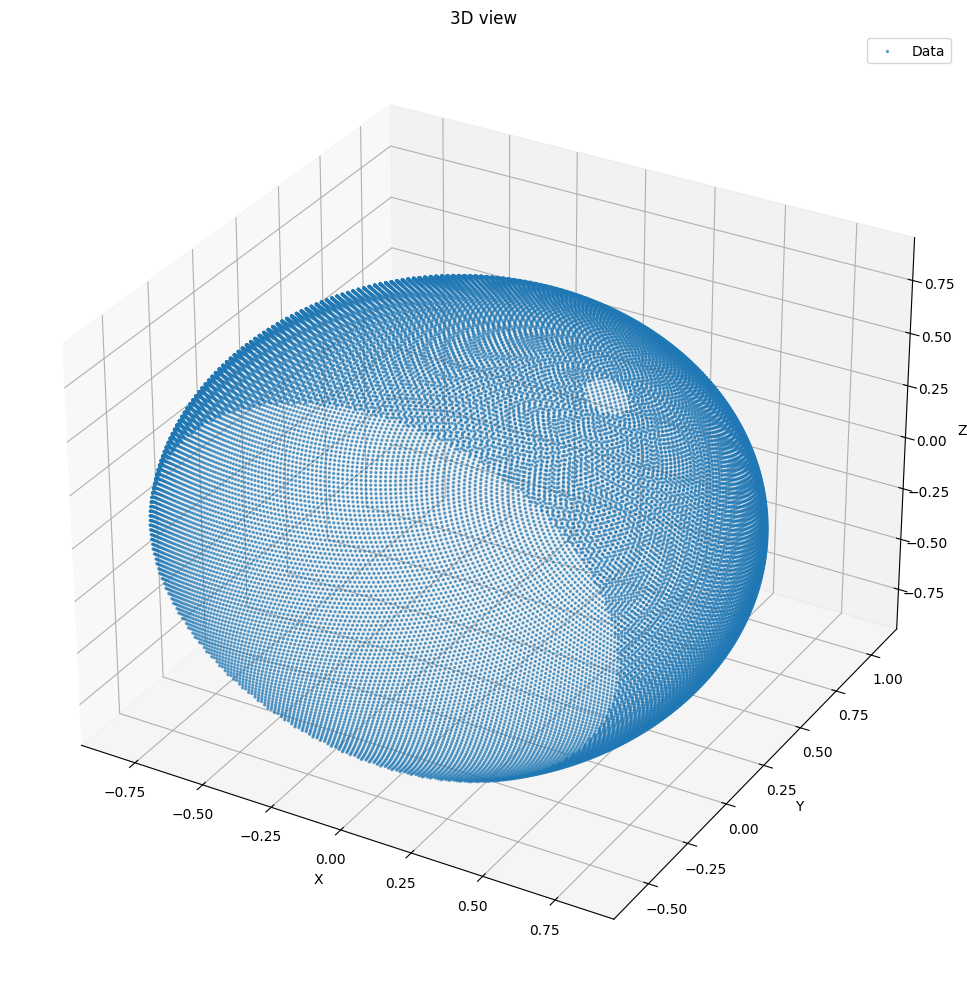

In [14]:
peripheral_retina_horizontal = uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_retina_horizontal)

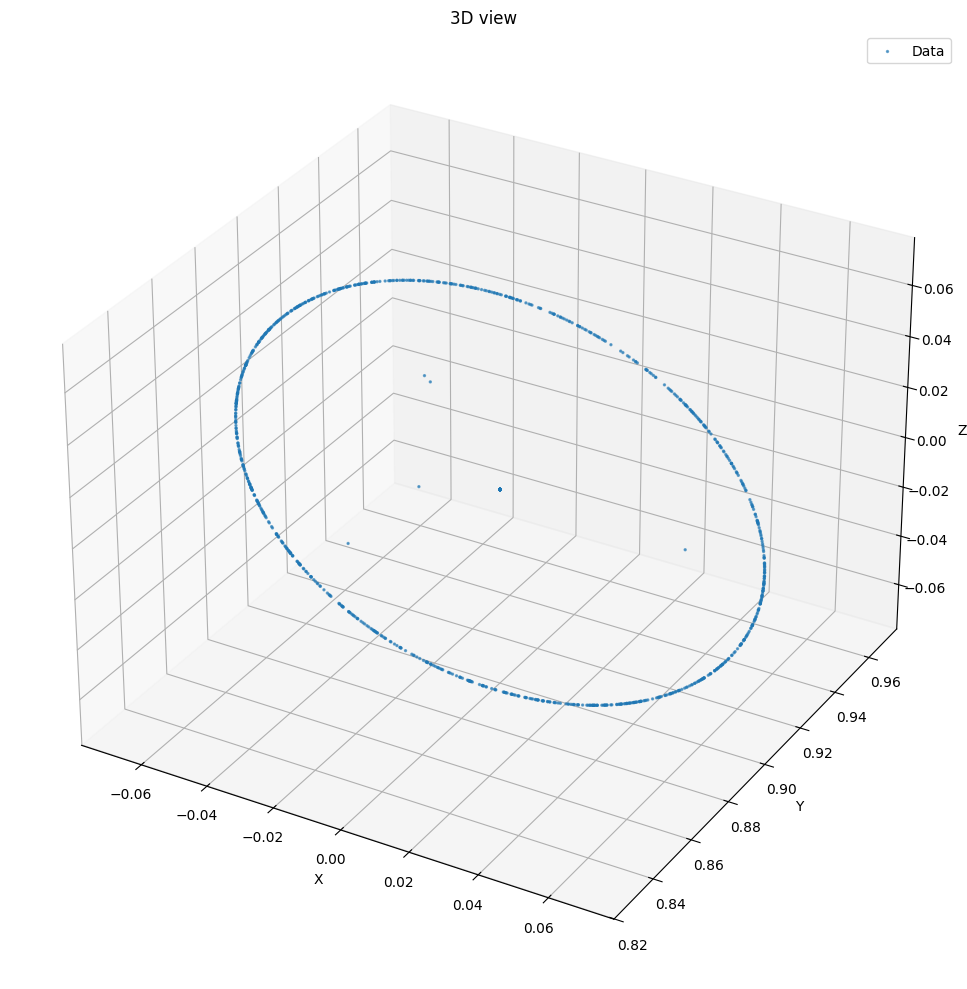

In [15]:
parafovea_horizontal = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea_horizontal)

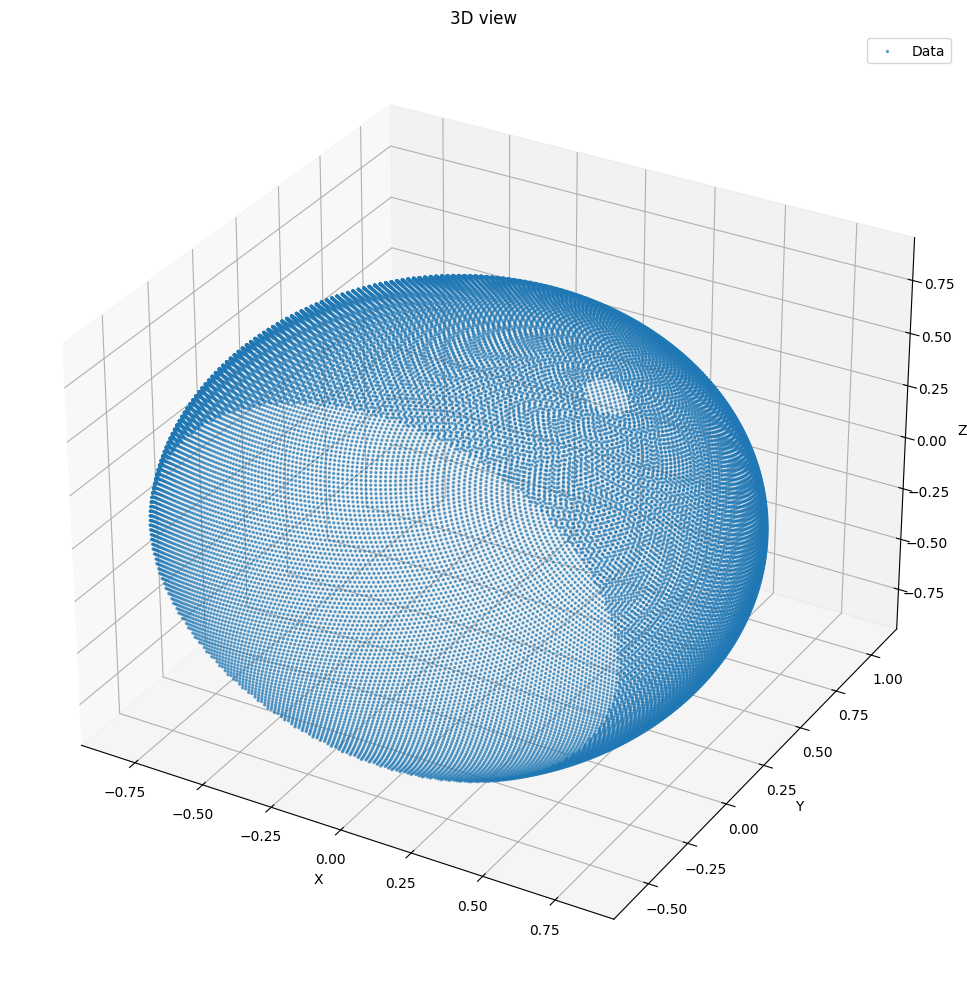

In [16]:
peripheral_retina_bipolar_OFF = uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_retina_bipolar_OFF)

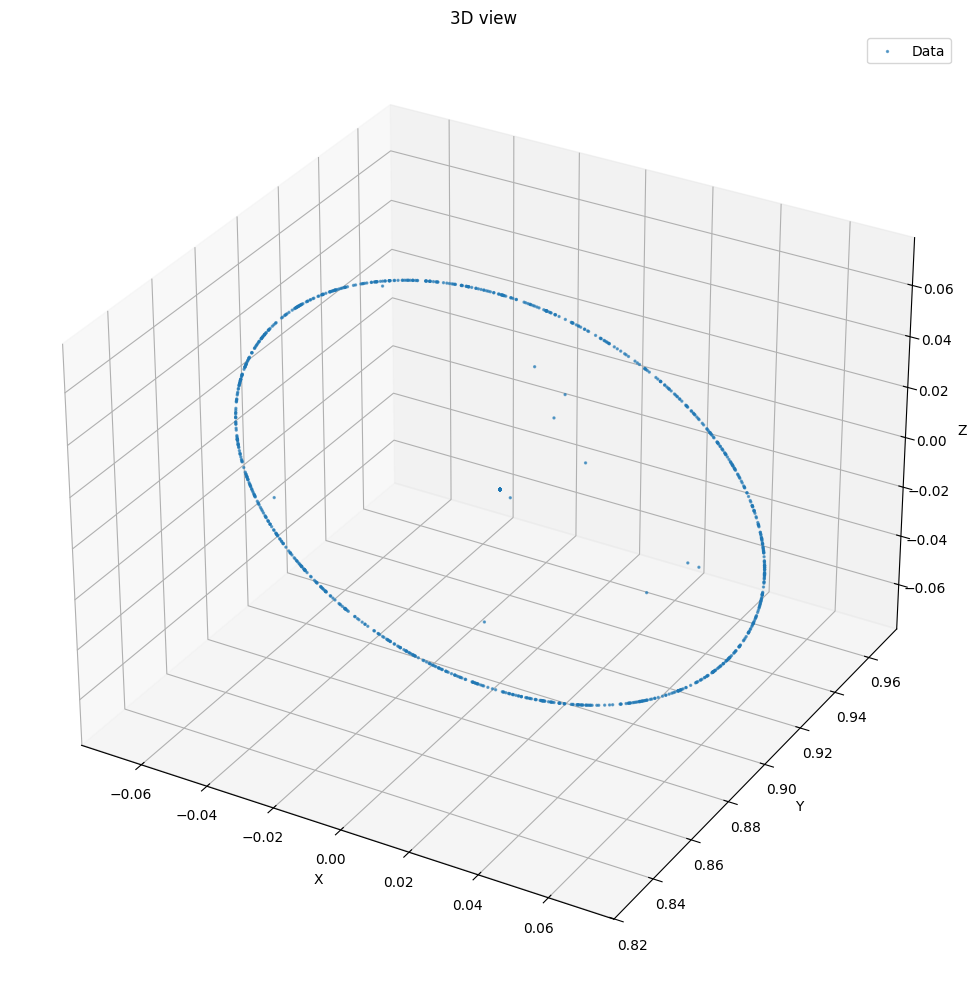

In [17]:
parafovea_bipolar_OFF = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea_bipolar_OFF)

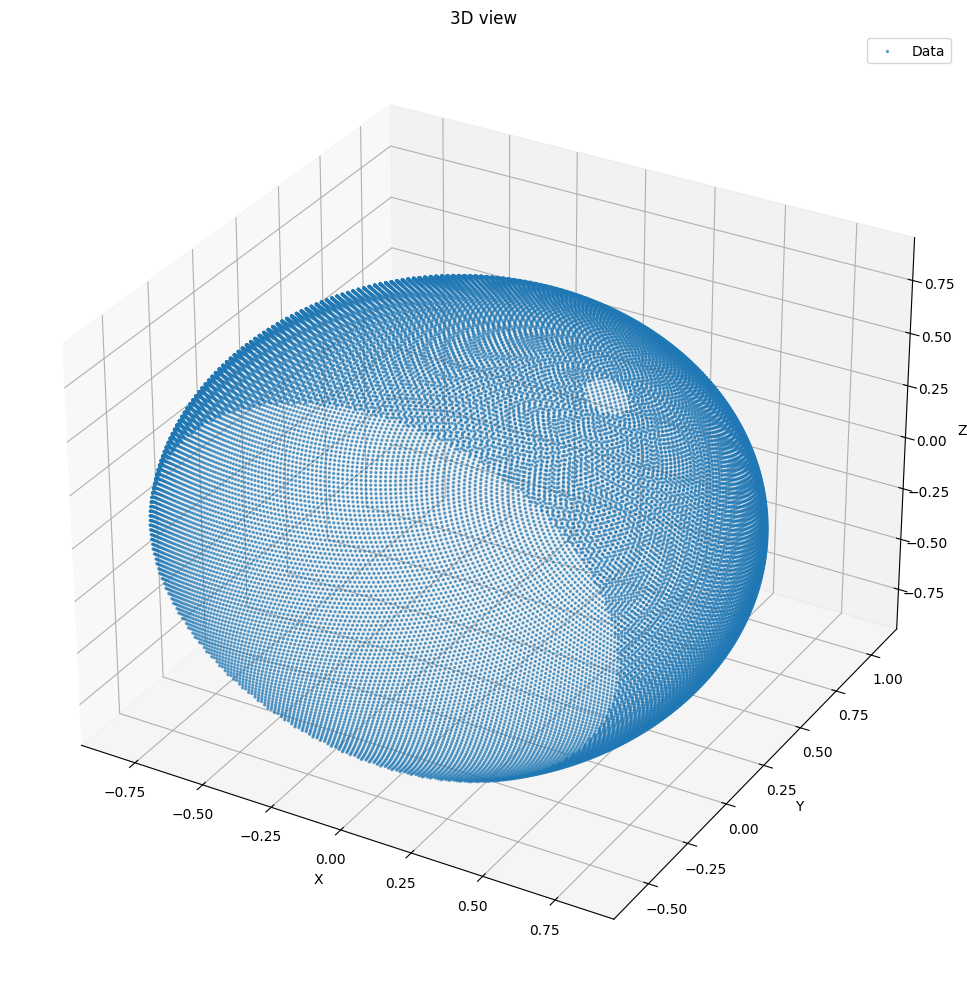

In [18]:
peripheral_retina_bipolar_ON = uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_retina_bipolar_ON)

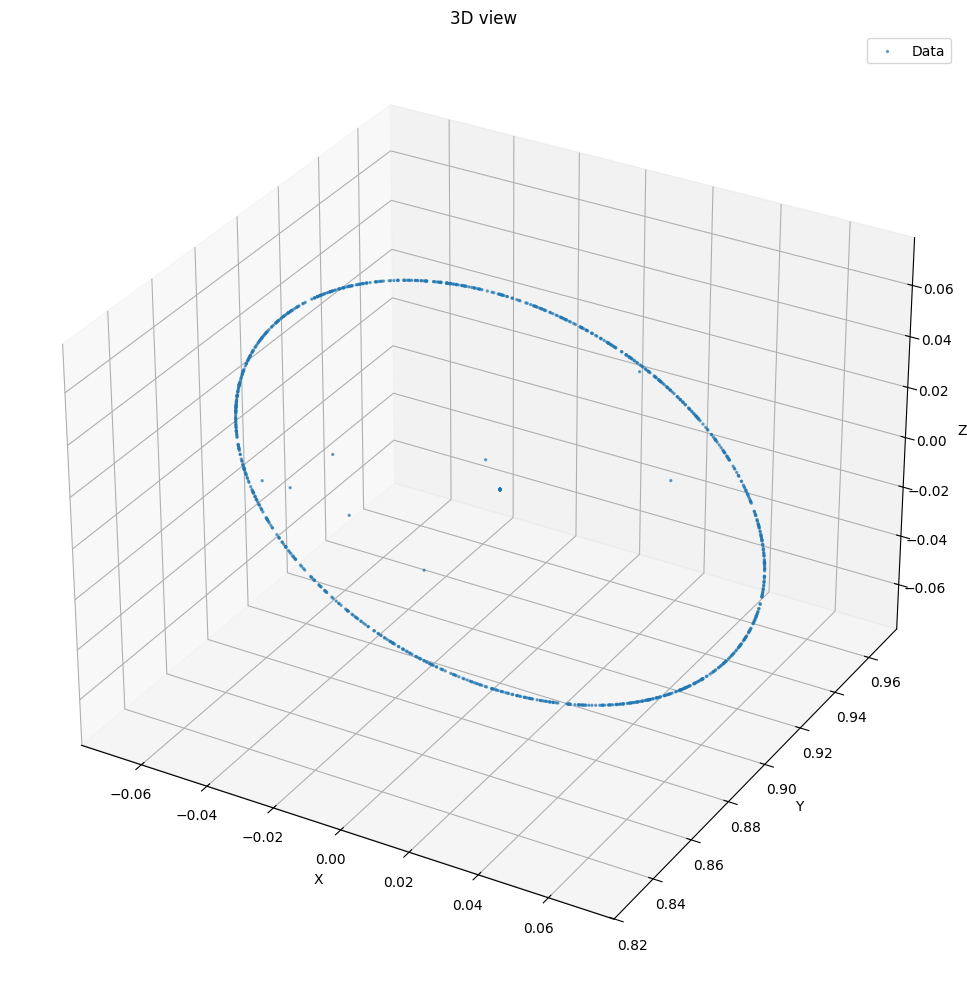

In [19]:
parafovea_bipolar_ON = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea_bipolar_ON)

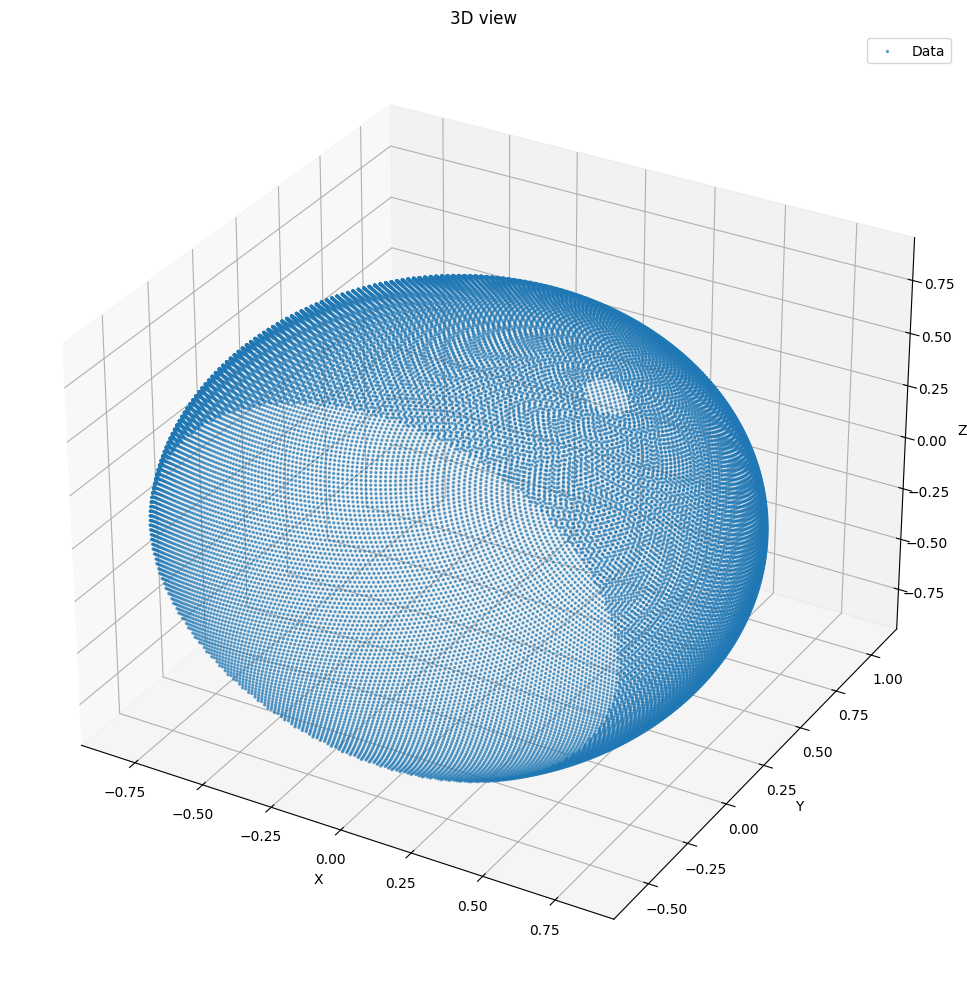

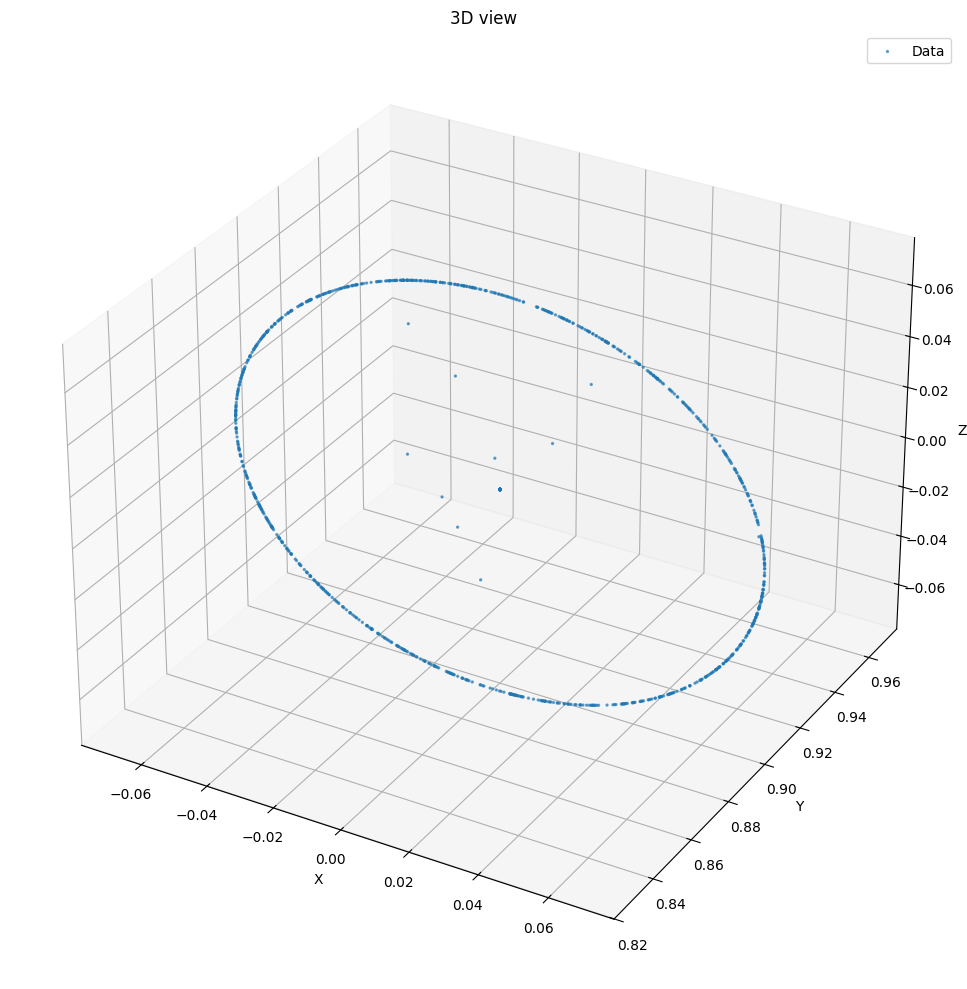

In [20]:
peripheral_amecrine = uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_amecrine)
parafovea__amecrine  = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea__amecrine)

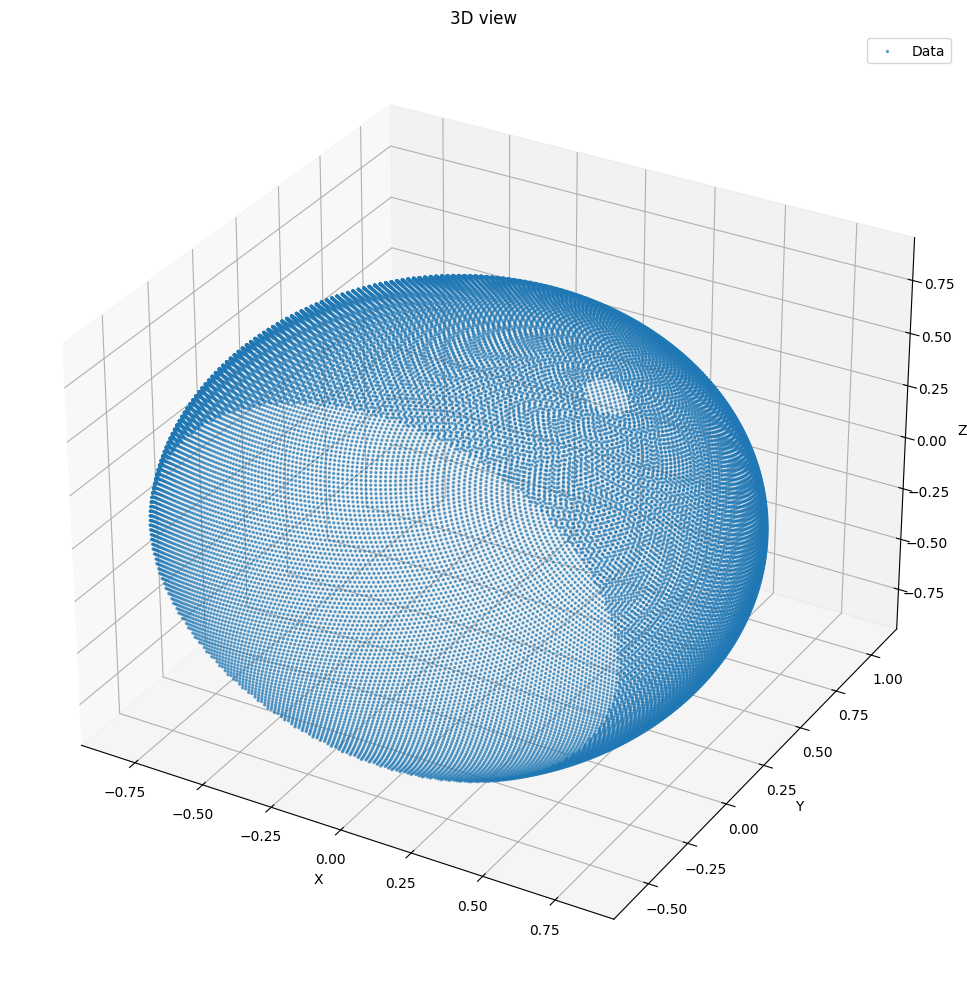

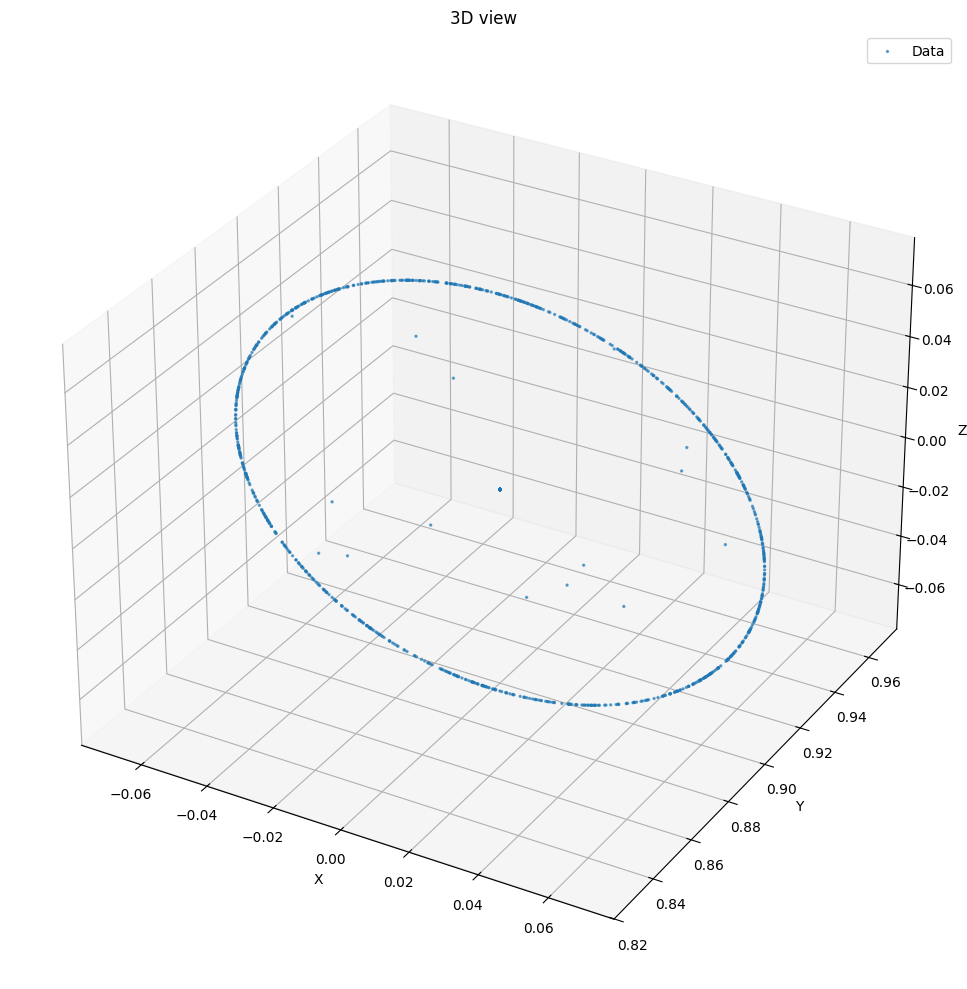

In [21]:
peripheral_ganglions= uniform_sphere_band(n=30000,r=0.95,angle_start_deg=5,angle_end_deg=120)
plot_point_sets(peripheral_ganglions)
parafovea__ganglions  = uniform_cap_points(n=2000,r=0.9,angle_deg=5,noise=0.3)
plot_point_sets(parafovea__ganglions)

In [22]:
def create_retinal_layers(params: dict = None, plot: bool = False) -> dict:

    defaults = {
        'radius_base': 1.0,
        'radius_step': 0.05,     
        'radius_max_delta': 0.2,  
        'foveola_angle_deg': 5.0,
        'iris_angle_deg': 120.0,
        'noise': 0.3,
        'foveal_radius_offset': 0.05, 
        
        'n_horizontal_peripheral': 300,
        'n_horizontal_foveal': 20,
        
        'n_bipolar_peripheral': 300,
        'n_bipolar_foveal': 20,
        
        'n_amacrine_peripheral': 300,
        'n_amacrine_foveal': 20,
        
        'n_ganglion_peripheral': 300,
        'n_ganglion_foveal': 20,
    }
    p = {**defaults, **(params or {})}
    
    layer_order = ['horizontal', 'bipolar_ON', 'bipolar_OFF', 'amacrine', 'ganglion']
    
    def calc_radius(layer_idx):
        delta = min(p['radius_base'] * p['radius_step'] * layer_idx, p['radius_max_delta'])
        return p['radius_base'] - delta
    
    def make_layer(n_periph, n_foveal, r_periph):
        r_foveal = r_periph - p['foveal_radius_offset']
        periph = uniform_sphere_band(
            n=n_periph, r=r_periph,
            angle_start_deg=p['foveola_angle_deg'],
            angle_end_deg=p['iris_angle_deg'],
            noise=p['noise']
        )
        foveal = uniform_cap_points(
            n=n_foveal, r=r_foveal,
            angle_deg=p['foveola_angle_deg'],
            noise=p['noise']
        )
        return {
            'peripheral': periph, 
            'foveal': foveal, 
            'all': np.concatenate([periph, foveal]),
            'radius_peripheral': r_periph,
            'radius_foveal': r_foveal,
        }
    
    layer_params = {
        'horizontal': (p['n_horizontal_peripheral'], p['n_horizontal_foveal']),
        'bipolar_ON': (p['n_bipolar_peripheral'], p['n_bipolar_foveal']),
        'bipolar_OFF': (p['n_bipolar_peripheral'], p['n_bipolar_foveal']),
        'amacrine': (p['n_amacrine_peripheral'], p['n_amacrine_foveal']),
        'ganglion': (p['n_ganglion_peripheral'], p['n_ganglion_foveal']),
    }
    
    layers = {}
    for idx, name in enumerate(layer_order):
        n_periph, n_foveal = layer_params[name]
        r = calc_radius(idx)
        layers[name] = make_layer(n_periph, n_foveal, r)
    
    # Counts
    counts = {}
    for name, layer in layers.items():
        counts[f'{name}_peripheral'] = len(layer['peripheral'])
        counts[f'{name}_foveal'] = len(layer['foveal'])
        counts[f'{name}_total'] = len(layer['all'])
        counts[f'{name}_radius'] = layer['radius_peripheral']
    counts['total'] = sum(len(l['all']) for l in layers.values())
    
    result = {
        **layers,
        'counts': counts,
        'params': p,
        'layer_order': layer_order,
    }
    
    if plot:
        _plot_retinal_layers(layers, p, layer_order)
    
    return result


def _plot_retinal_layers(layers: dict, p: dict, layer_order: list):
    colors = {
        'horizontal': ('orange', 'darkorange'),
        'bipolar_ON': ('lime', 'darkgreen'),
        'bipolar_OFF': ('cyan', 'darkcyan'),
        'amacrine': ('magenta', 'darkmagenta'),
        'ganglion': ('yellow', 'gold'),
    }
    
    fig = plt.figure(figsize=(16, 6))
    r = p['radius_base']
    
    def scatter_all(ax):
        for name in layer_order:
            layer = layers[name]
            c_periph, c_foveal = colors[name]
            r_p = layer['radius_peripheral']
            ax.scatter(*layer['peripheral'].T, s=1, c=c_periph, alpha=0.3,
                      label=f"{name} (r={r_p:.2f})")
            ax.scatter(*layer['foveal'].T, s=4, c=c_foveal, alpha=0.7)
        ax.set_xlim(-r*1.2, r*1.2)
        ax.set_ylim(-r*1.2, r*1.2)
        ax.set_zlim(-r*1.2, r*1.2)
    
    ax1 = fig.add_subplot(121, projection='3d')
    scatter_all(ax1)
    ax1.legend(loc='upper left', fontsize=7)
    ax1.set_title(f'Retinal Layers (5% radius decrease per layer)')
    ax1.view_init(elev=15, azim=45)
    
    ax2 = fig.add_subplot(122, projection='3d')
    scatter_all(ax2)
    ax2.set_title('Frontview')
    ax2.view_init(elev=90, azim=0)
    
    plt.tight_layout()
    plt.show()

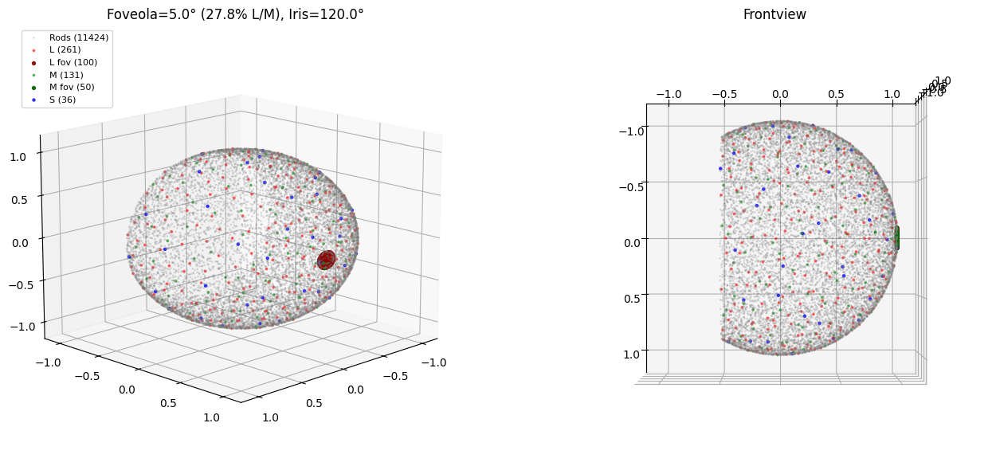

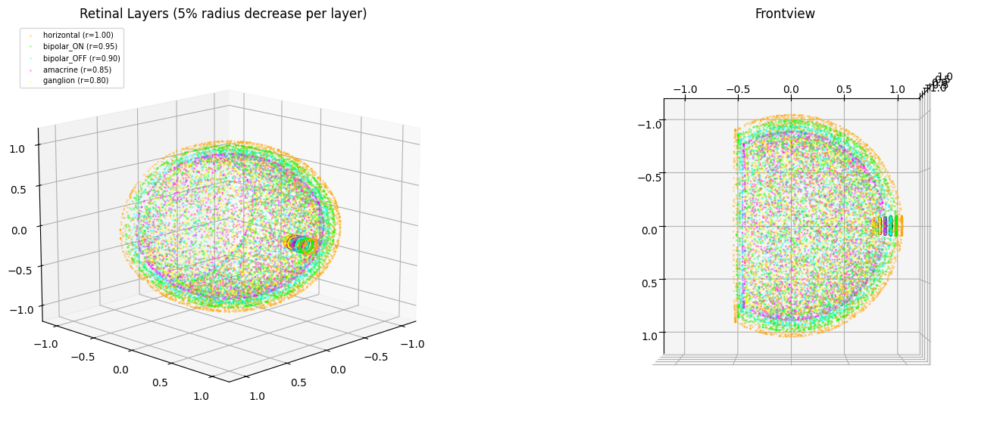

{'horizontal_peripheral': 3000, 'horizontal_foveal': 200, 'horizontal_total': 3200, 'horizontal_radius': 1.0, 'bipolar_ON_peripheral': 3000, 'bipolar_ON_foveal': 200, 'bipolar_ON_total': 3200, 'bipolar_ON_radius': 0.95, 'bipolar_OFF_peripheral': 3000, 'bipolar_OFF_foveal': 200, 'bipolar_OFF_total': 3200, 'bipolar_OFF_radius': 0.9, 'amacrine_peripheral': 3000, 'amacrine_foveal': 200, 'amacrine_total': 3200, 'amacrine_radius': 0.85, 'ganglion_peripheral': 3000, 'ganglion_foveal': 200, 'ganglion_total': 3200, 'ganglion_radius': 0.8, 'total': 16000}


In [47]:
default_rods={
    'layer_count': 12000,
    
    'rod_ratio': 0.952,
    'L_ratio': 0.030,
    'M_ratio': 0.015,
    'S_ratio': 0.003,
    
    'foveola_L_ratio_base': 0.004,
    'foveola_M_ratio_base': 0.004,
    'foveola_angle_base_deg': 0.6,
    'foveola_max_ratio': 0.5,
    
    'foveola_angle_deg': 5.0,
    'iris_angle_deg': 120.0,
    
    'radius': 1.0,
    'noise': 0.02,
}
defaults_layers = {
        'radius_base': 1.0,
        'radius_step': 0.05,     
        'radius_max_delta': 0.2,  
        'foveola_angle_deg': 5.0,
        'iris_angle_deg': 120.0,
        'noise': 0.3,
        'foveal_radius_offset': 0.05, 
        
        'n_horizontal_peripheral': 3000,
        'n_horizontal_foveal': 200,
        
        'n_bipolar_peripheral': 3000,
        'n_bipolar_foveal': 200,
        
        'n_amacrine_peripheral': 3000,
        'n_amacrine_foveal': 200,
        
        'n_ganglion_peripheral': 3000,
        'n_ganglion_foveal': 200,
    }
rods_n_cones = create_photoreceptor_layer(default_rods,plot=True)
retina = create_retinal_layers(params=defaults_layers,plot=True)

horizontal_all = retina['horizontal']['all']
ganglion_foveal = retina['ganglion']['foveal']
bipolar_on_periph = retina['bipolar_ON']['peripheral']

print(retina['counts'])

In [32]:
retina.keys()

dict_keys(['horizontal', 'bipolar_ON', 'bipolar_OFF', 'amacrine', 'ganglion', 'counts', 'params', 'layer_order'])